# Augmentation Analysis for Object Detection

## Goal
The goal of this notebook is to analyze and evaluate different data augmentation techniques
for improving object detection performance.

## Approach
1. Visualize dataset
2. Define augmentation hypotheses
3. Apply and visualize augmentations
4. Train YOLO with different augmentation configurations
5. Compare results and draw conclusions

In [1]:
import os
# run once
os.chdir((os.path.join(os.getcwd(), '..')))

import sys
from pathlib import Path

lab_path = ""
for root, dirs, files in os.walk("/"):
    if "visualization.py" in files:
        lab_path = root
        break

sys.path.append(lab_path)

In [2]:
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

from pathlib import Path
from PIL import Image, ImageDraw
import albumentations as A

# Project imports
from visualization import visualize_image, read_yolo_labels, visualize_dataset_sample
from utils import yaml_read, generate_colors, yolo_to_xyxy
from train import run_pipeline

In [3]:
images_dir = Path("/home/maria/Projects/IAD_MAG_ML/LAB3/data/dm-2026-lab-3-object-detection/train_images/train_images")
labels_dir = Path("/home/maria/Projects/IAD_MAG_ML/LAB3/data/dm-2026-lab-3-object-detection/YOLO/labels/train")
yaml_path = Path("/home/maria/Projects/IAD_MAG_ML/LAB3/data/dm-2026-lab-3-object-detection/YOLO/yolo_dataset.yaml")

class_names = yaml_read(yaml_path)
colors = generate_colors(len(class_names))

## Dataset Exploration

We visualize sample images to understand:
- object sizes
- positions
- lighting conditions

  0%|          | 0/20 [00:00<?, ?it/s]

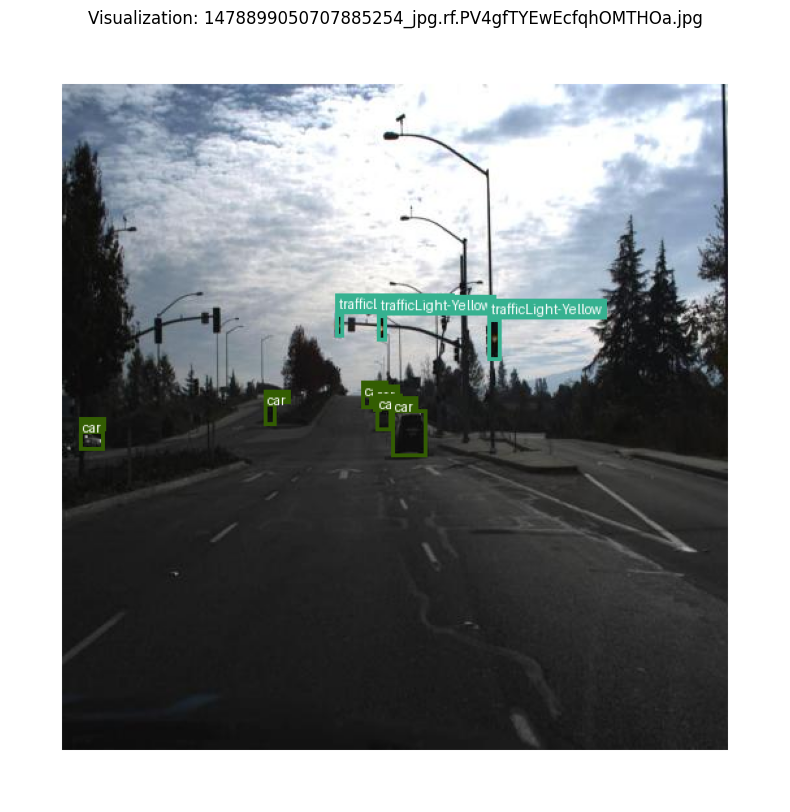

  5%|▌         | 1/20 [00:00<00:02,  7.62it/s]

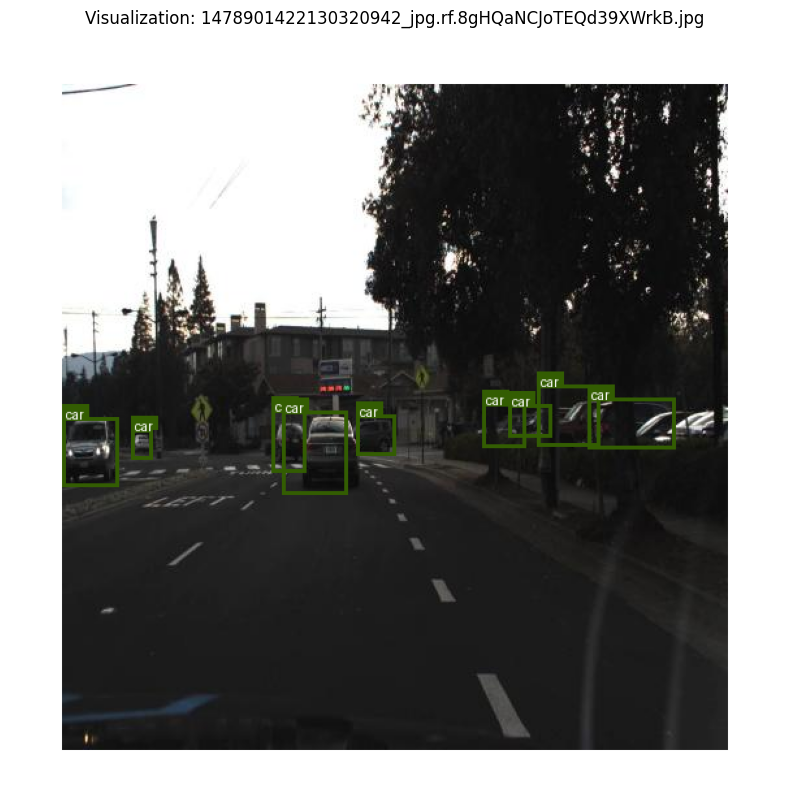

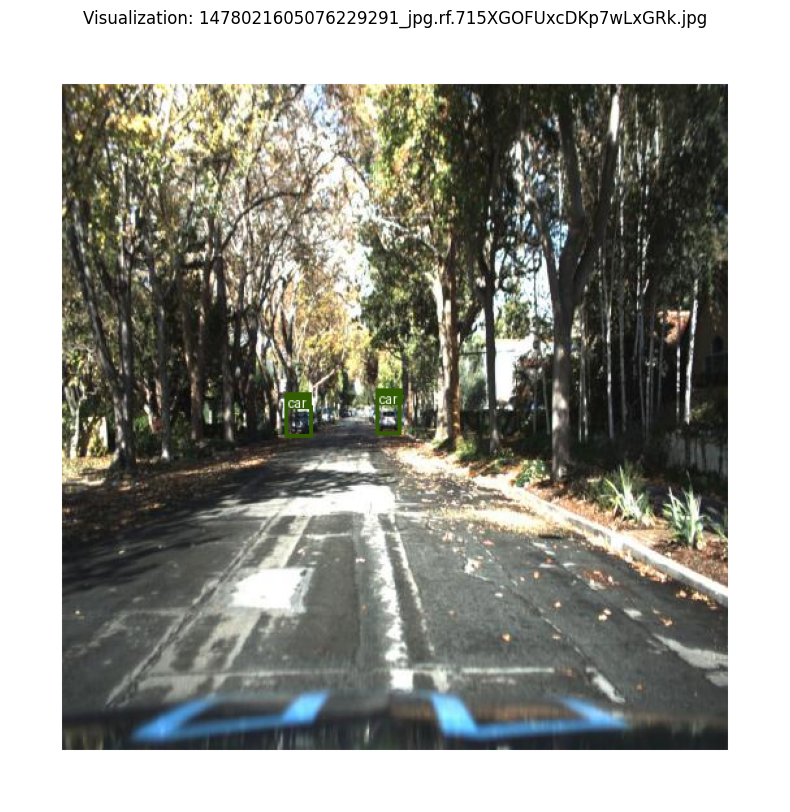

 15%|█▌        | 3/20 [00:00<00:02,  7.66it/s]

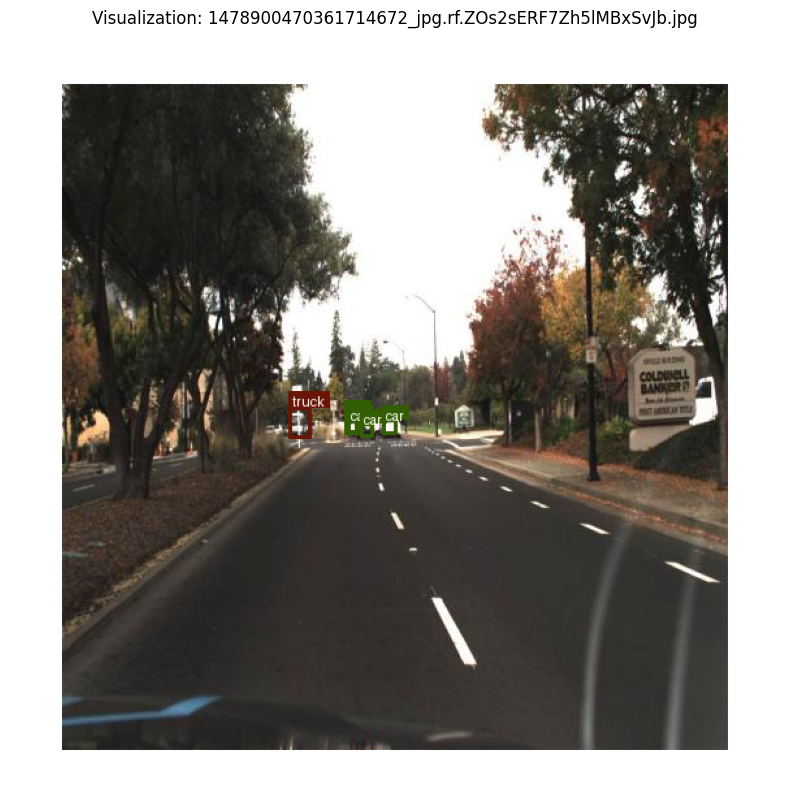

 20%|██        | 4/20 [00:00<00:02,  7.58it/s]

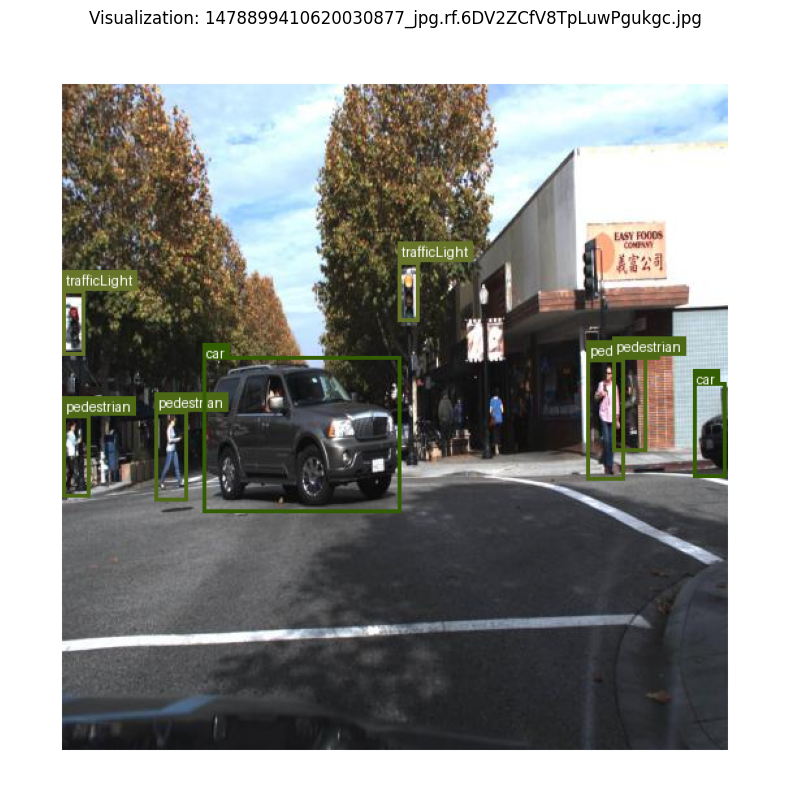

 25%|██▌       | 5/20 [00:00<00:02,  7.09it/s]

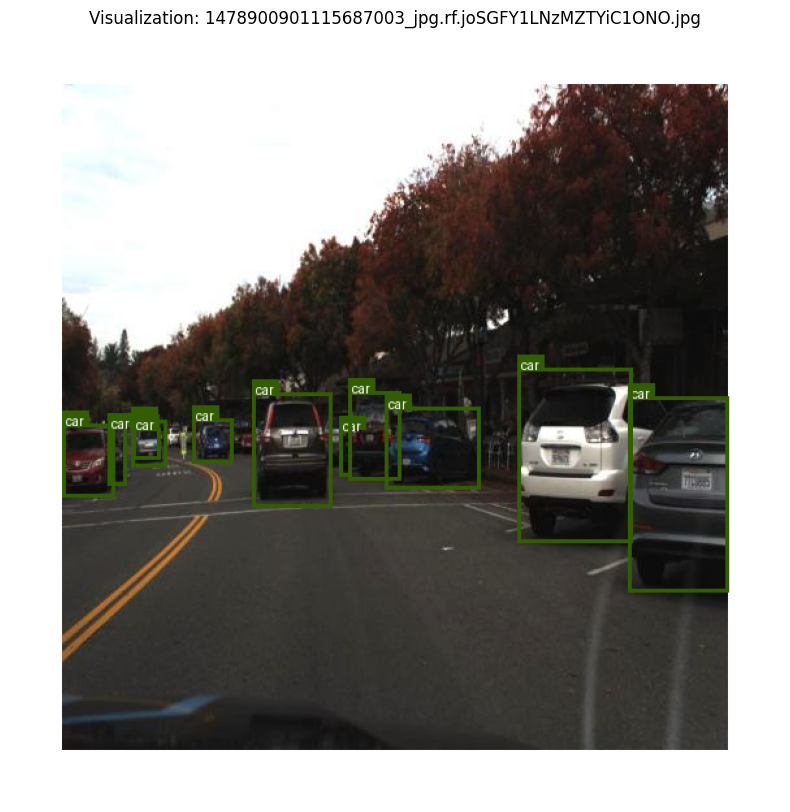

 30%|███       | 6/20 [00:00<00:01,  7.31it/s]

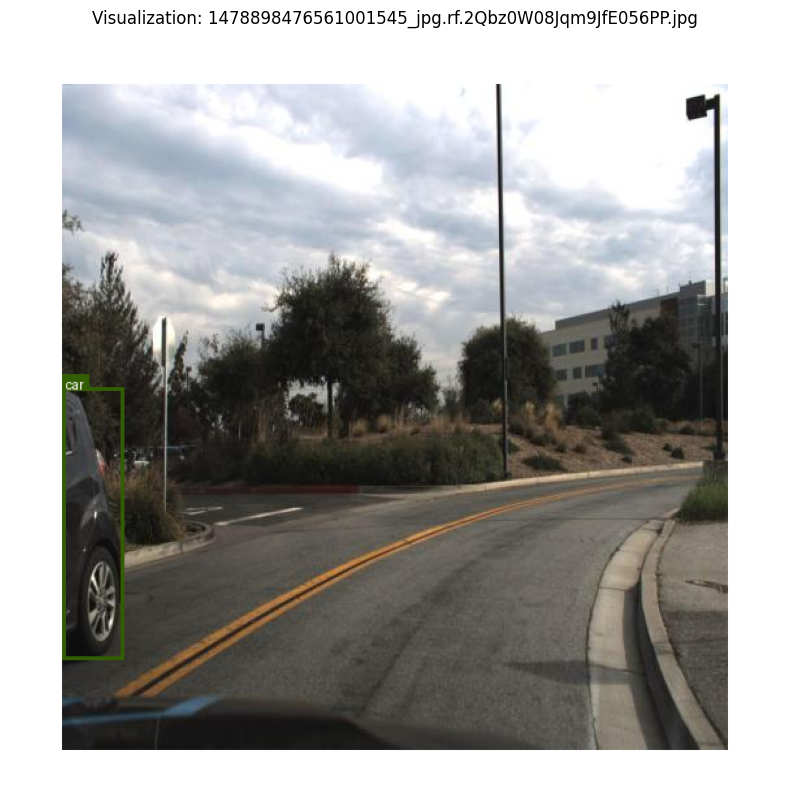

 35%|███▌      | 7/20 [00:00<00:01,  6.83it/s]

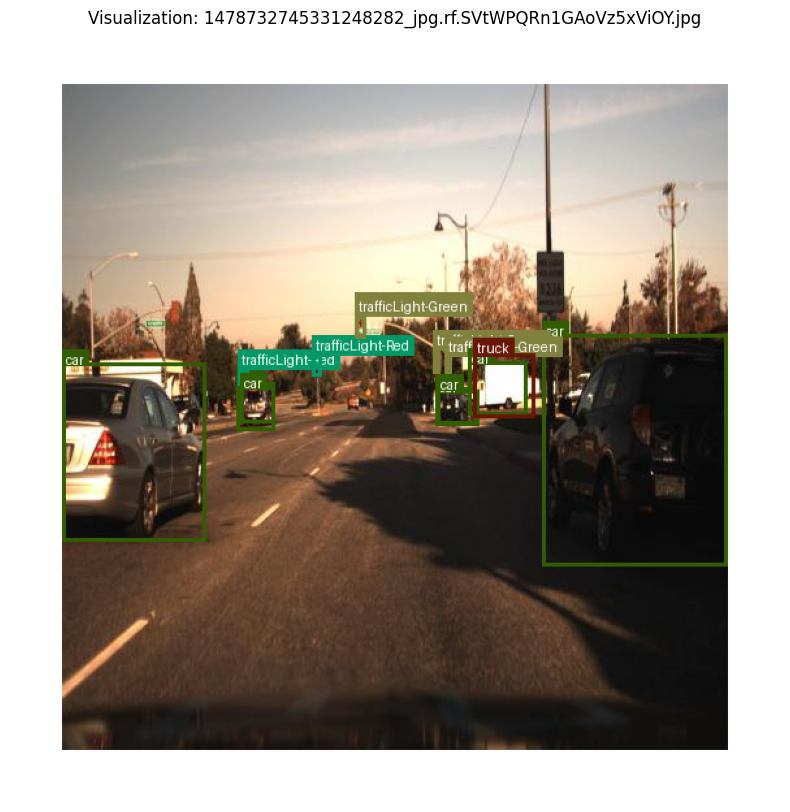

 40%|████      | 8/20 [00:01<00:01,  6.74it/s]

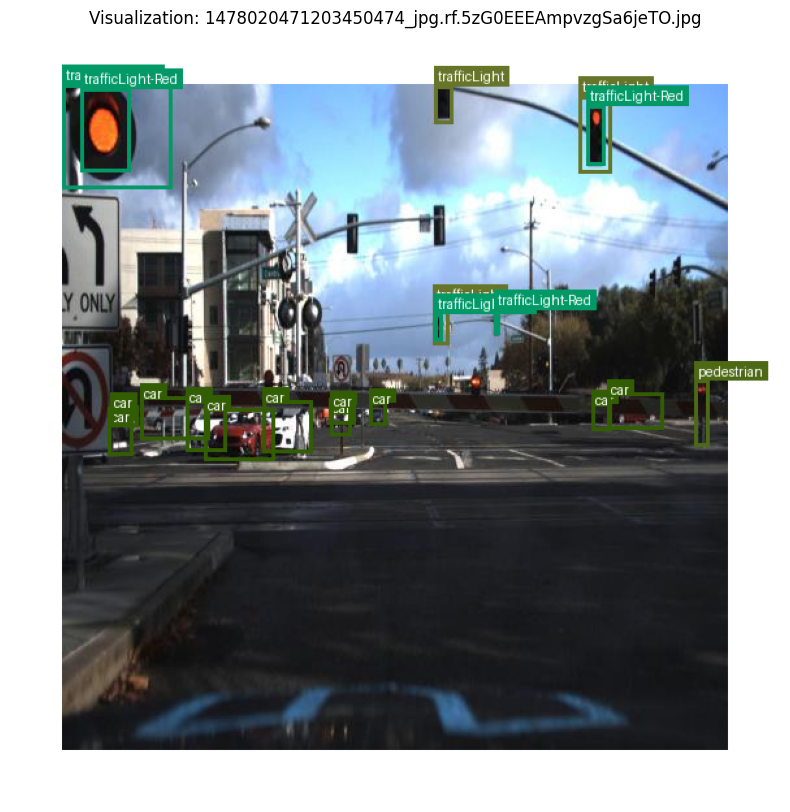

 45%|████▌     | 9/20 [00:01<00:01,  6.52it/s]

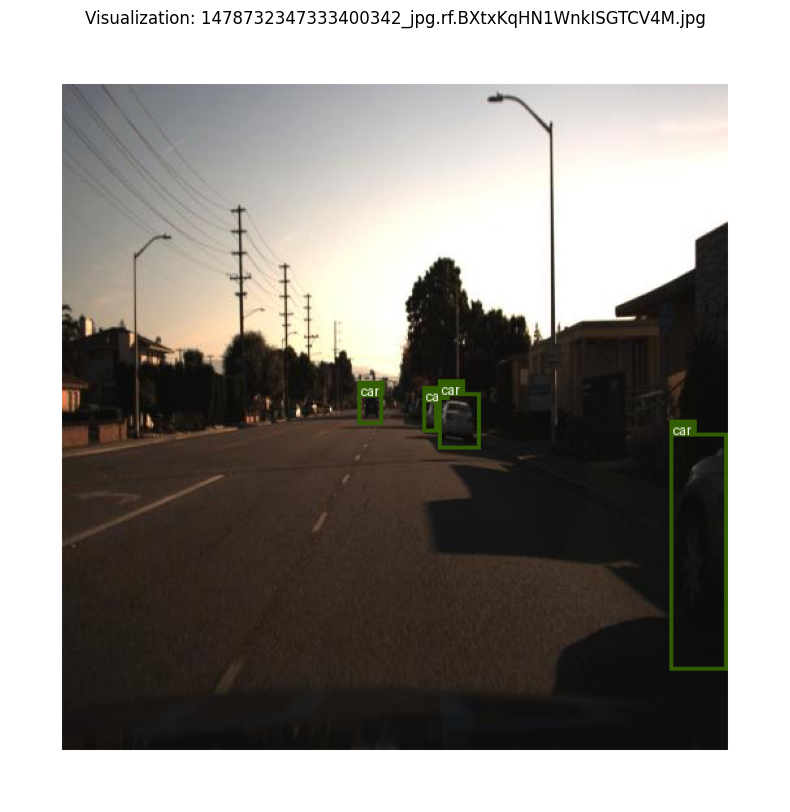

 50%|█████     | 10/20 [00:01<00:01,  6.94it/s]

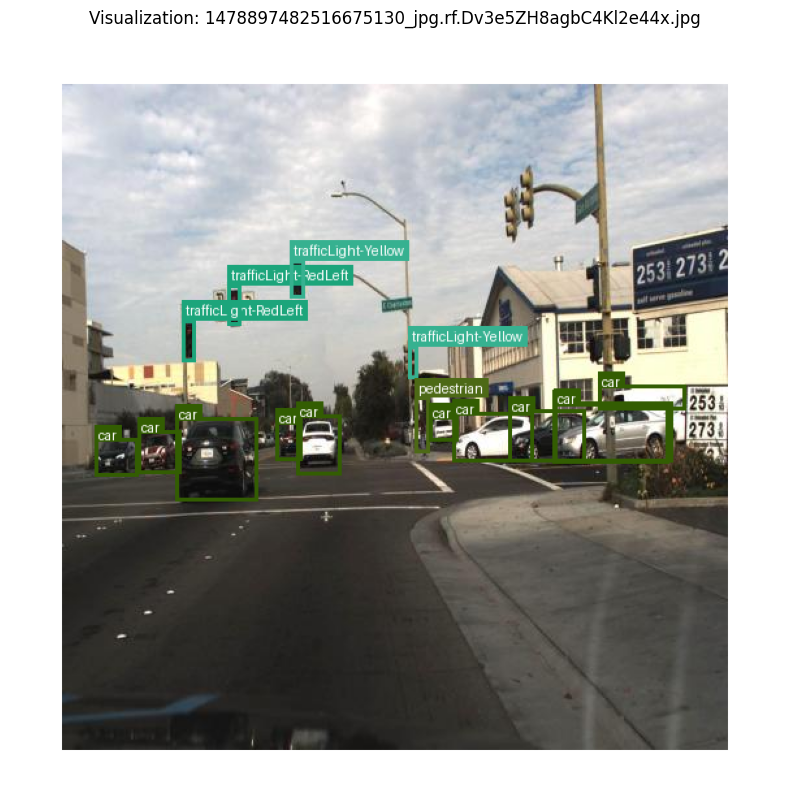

 55%|█████▌    | 11/20 [00:01<00:01,  6.74it/s]

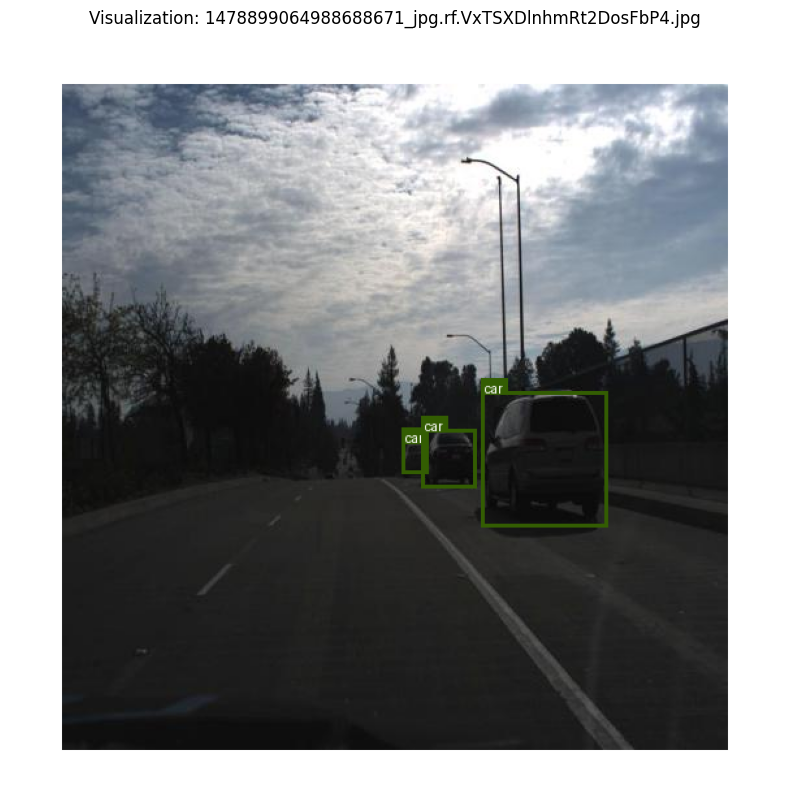

 60%|██████    | 12/20 [00:01<00:01,  7.07it/s]

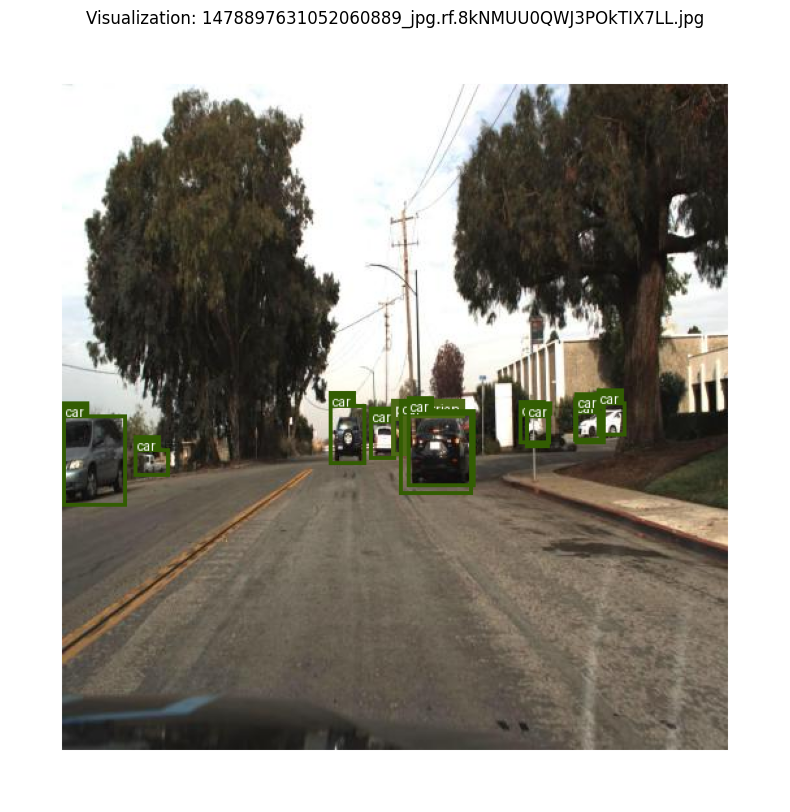

 65%|██████▌   | 13/20 [00:01<00:01,  6.78it/s]

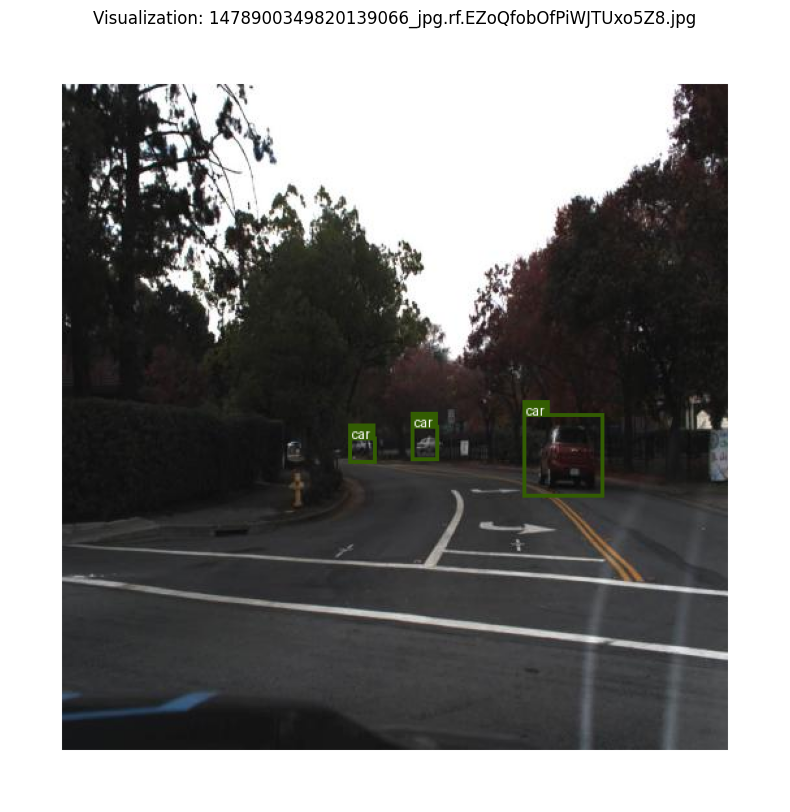

 70%|███████   | 14/20 [00:01<00:00,  7.10it/s]

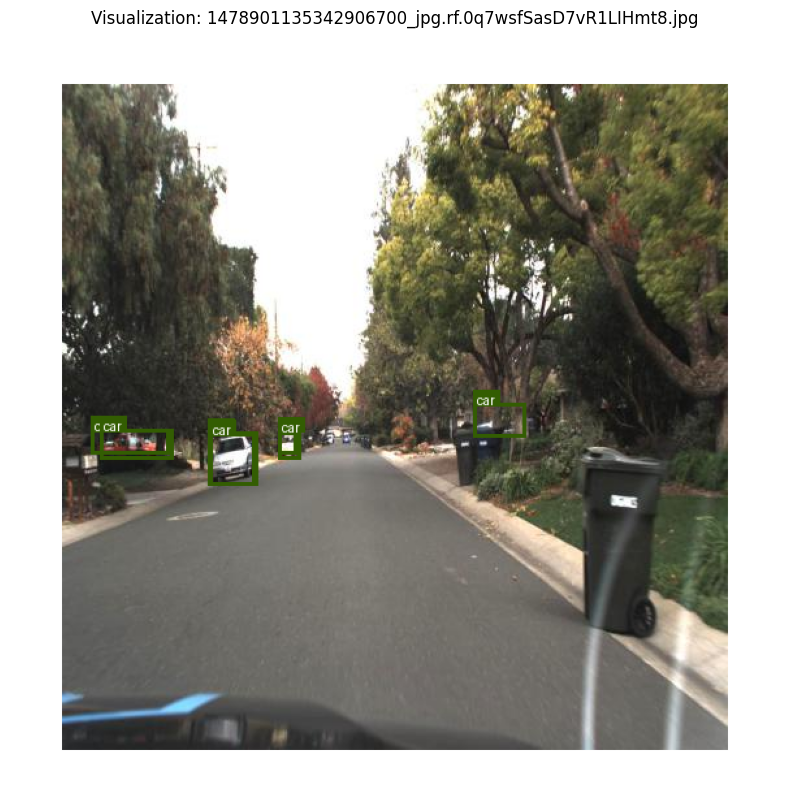

 75%|███████▌  | 15/20 [00:02<00:00,  6.93it/s]

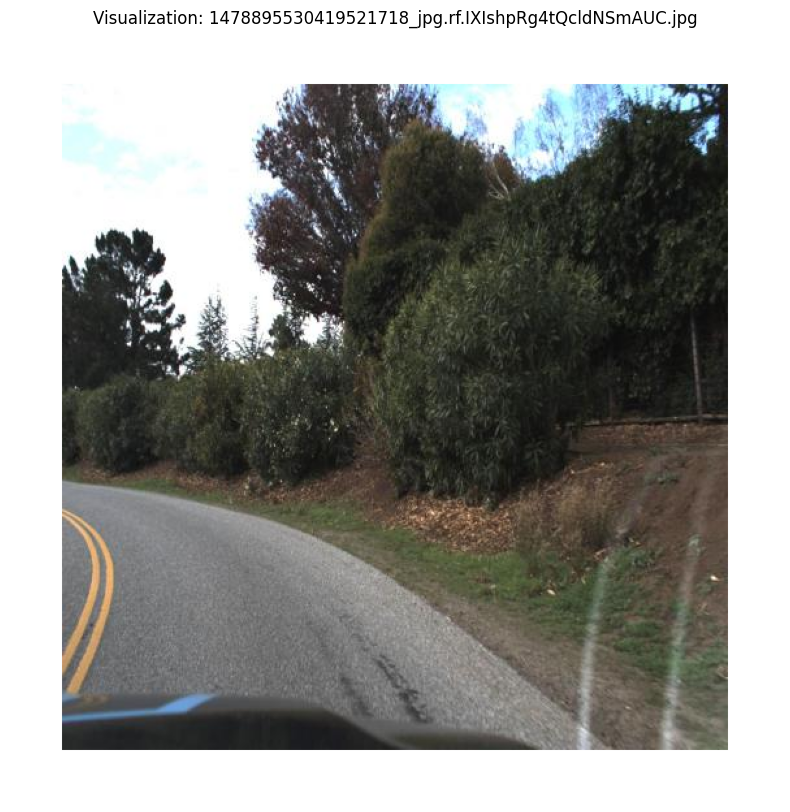

 80%|████████  | 16/20 [00:02<00:00,  6.74it/s]

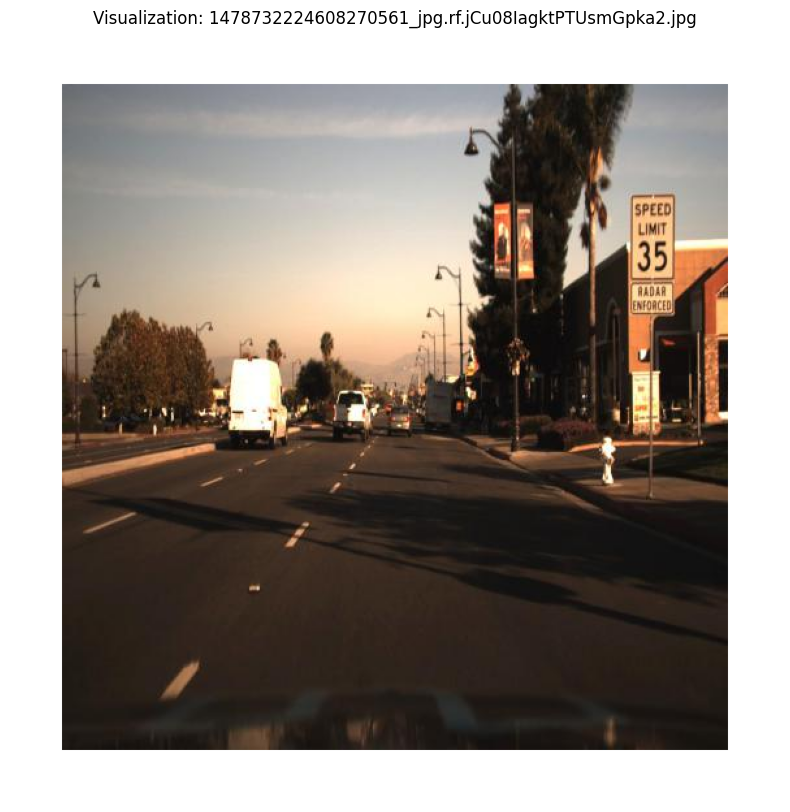

 85%|████████▌ | 17/20 [00:02<00:00,  6.79it/s]

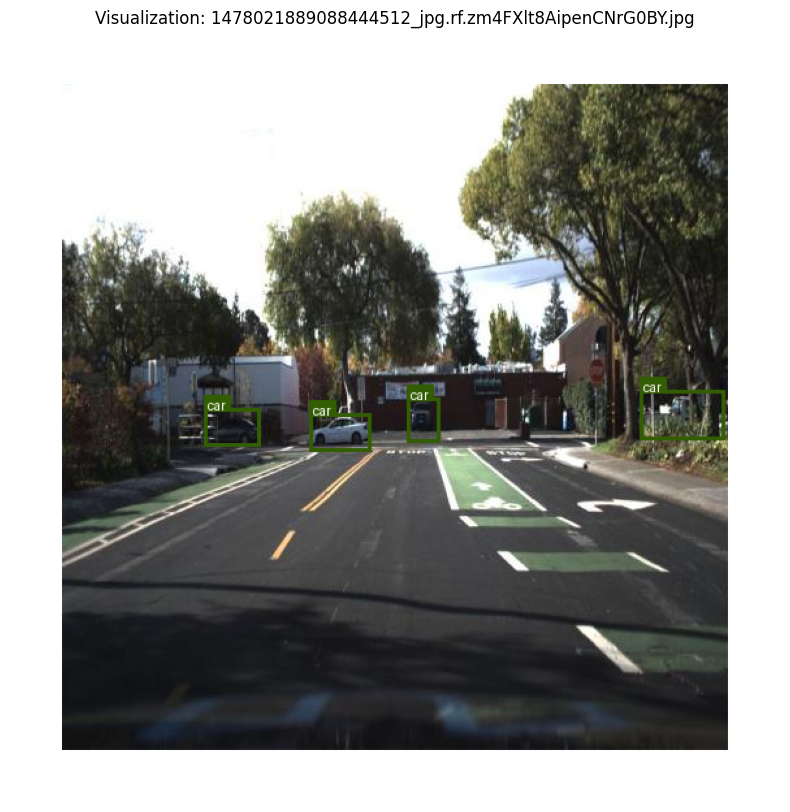

 90%|█████████ | 18/20 [00:02<00:00,  6.70it/s]

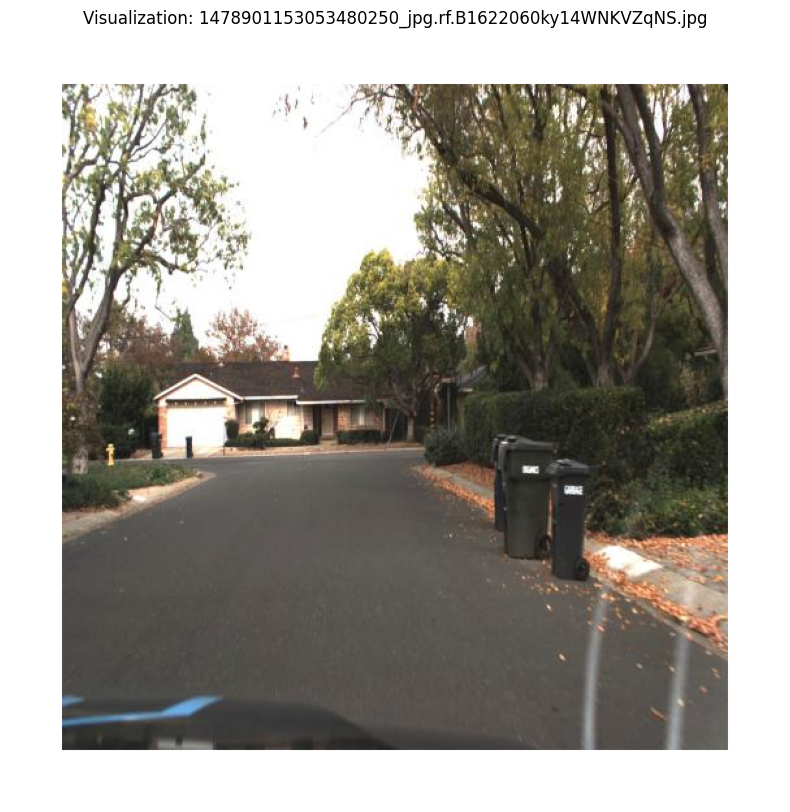

 95%|█████████▌| 19/20 [00:02<00:00,  6.74it/s]

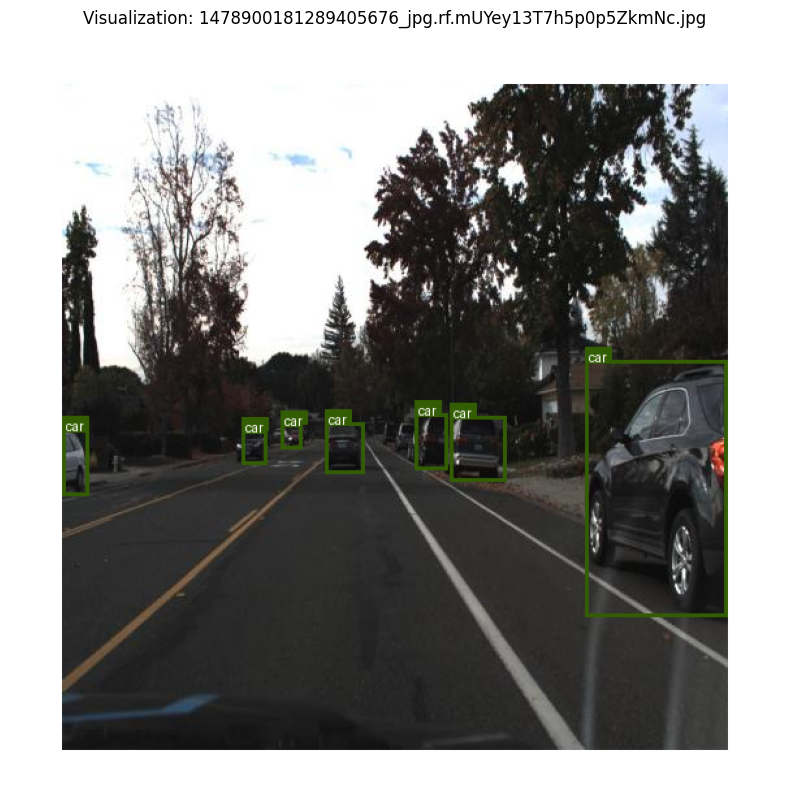

100%|██████████| 20/20 [00:02<00:00,  6.93it/s]


In [4]:
from visualization import visualize_dataset_sample

visualize_dataset_sample(
    images_dir,
    labels_dir,
    yaml_path,
    max_images=20
)

Based on dataset observations:

- Cars can appear in different orientations: so we can use horizontal flip
- Lighting conditions vary: images could be dark enough - we can apply some color augmentations
- Objects appear at different scales - for basic resizing objects we can use affine transformations
- Data may be some centered, so in that case we can try mosaic augmentation

We will test these augmentations

In [5]:
def visualize_augmented_image(image_path, label_path, transform):
    # Load image
    image = cv2.imread(str(image_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    h, w = image.shape[:2]

    # Load labels
    bboxes = read_yolo_labels(label_path)

    if len(bboxes) == 0:
        print("No bounding boxes found")
        return

    boxes = []
    labels = []

    for cls, x, y, bw, bh in bboxes:
        boxes.append([x, y, bw, bh])
        labels.append(cls)

    # Apply augmentation
    transformed = transform(
        image=image,
        bboxes=boxes,
        class_labels=labels
    )

    aug_img = transformed["image"]
    aug_boxes = transformed["bboxes"]
    aug_labels = transformed["class_labels"]

    # Draw boxes
    img_pil = Image.fromarray(aug_img)
    draw = ImageDraw.Draw(img_pil)

    for bbox, cls in zip(aug_boxes, aug_labels):
        _, x1, y1, x2, y2 = yolo_to_xyxy((cls, *bbox), aug_img.shape[1], aug_img.shape[0])
        draw.rectangle([x1, y1, x2, y2], outline=colors[int(cls)], width=3)
        draw.text((x1, y1 - 10), class_names[int(cls)], fill=colors[int(cls)])

    plt.figure(figsize=(6, 6))
    plt.imshow(img_pil)
    plt.axis("off")
    plt.show()

In [6]:
aug_flip = A.Compose([
    A.HorizontalFlip(p=1.0),
], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

In [7]:
aug_color = A.Compose([
    A.ColorJitter(
        brightness=0.5,   # ≈ hsv_v
        contrast=0.4,
        saturation=0.7,   # ≈ hsv_s
        hue=0.015, # ≈ hsv_h
        p=1.0
    ),
], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

/home/maria/miniconda3/envs/da/lib/python3.10/site-packages/albumentations/core/composition.py:331: UserWarning: Got processor for bboxes, but no transform to process it.
  self._set_keys()


In [8]:
aug_affine = A.Compose([
    A.Affine(
        scale=(0.8, 1.2),              # matches scale=0.2
        translate_percent=(-0.1, 0.1), # matches translate=0.1
        rotate=(-10, 10),              # matches degrees=10
        shear=(-2, 2),
        p=1.0
    ),
], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

Original:


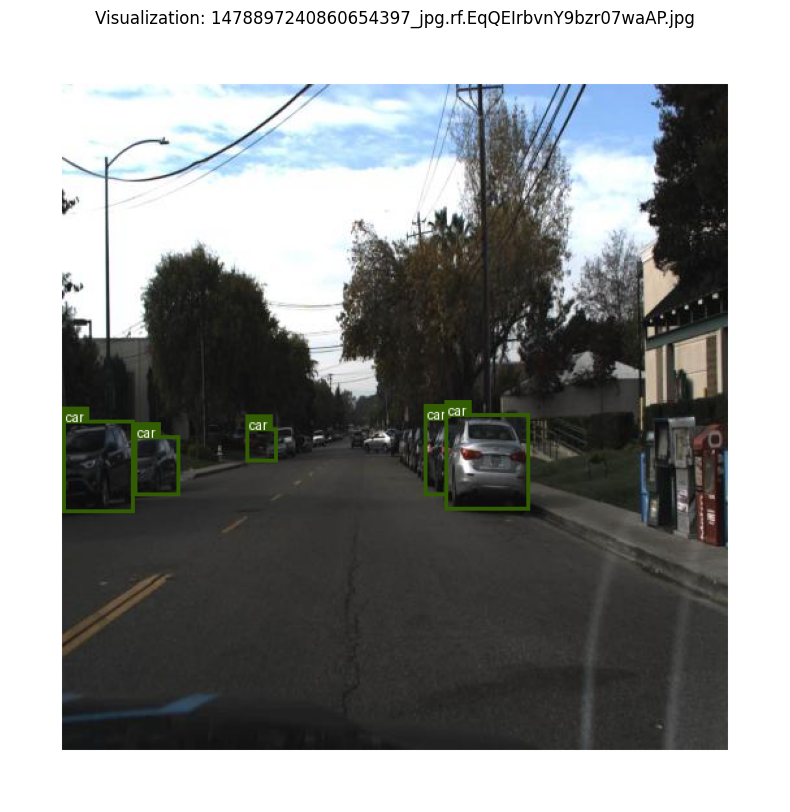

Flip:


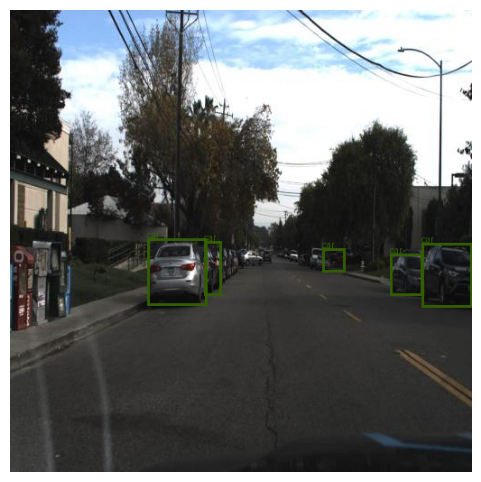

Color:


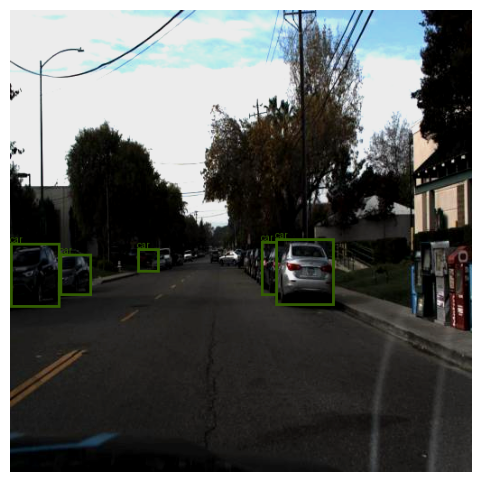

Affine:


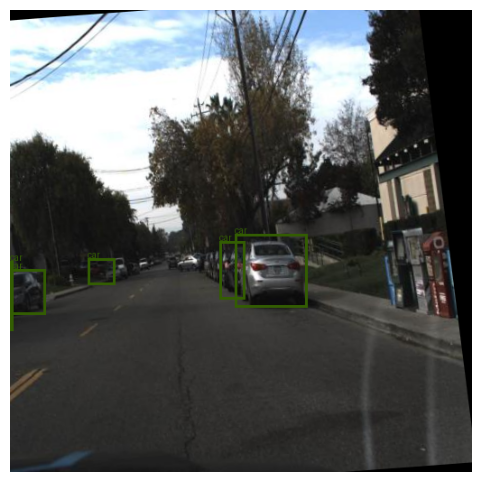

Original:


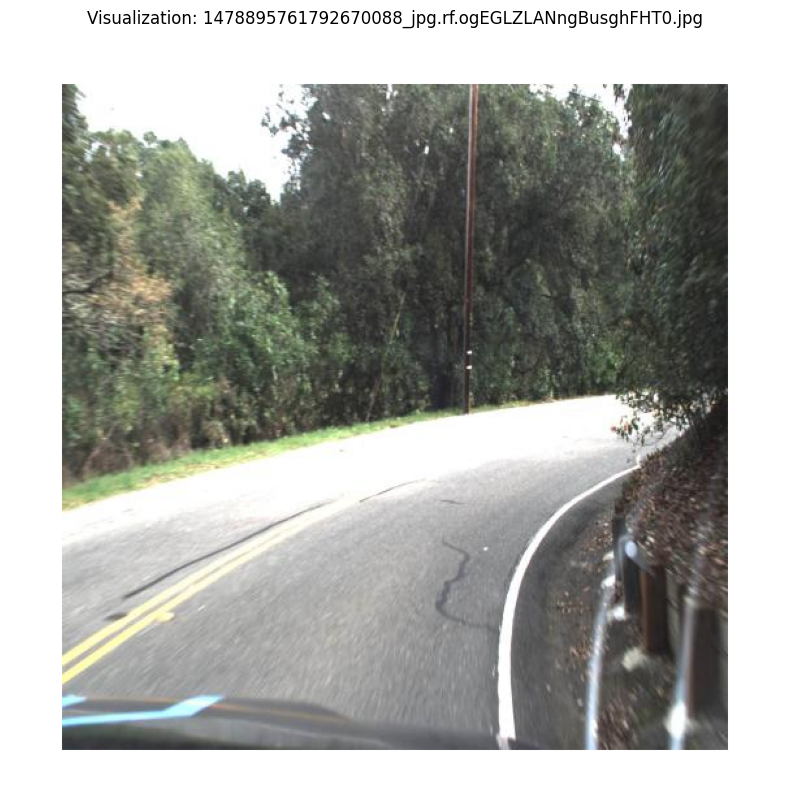

Flip:
No bounding boxes found
Color:
No bounding boxes found
Affine:
No bounding boxes found
Original:


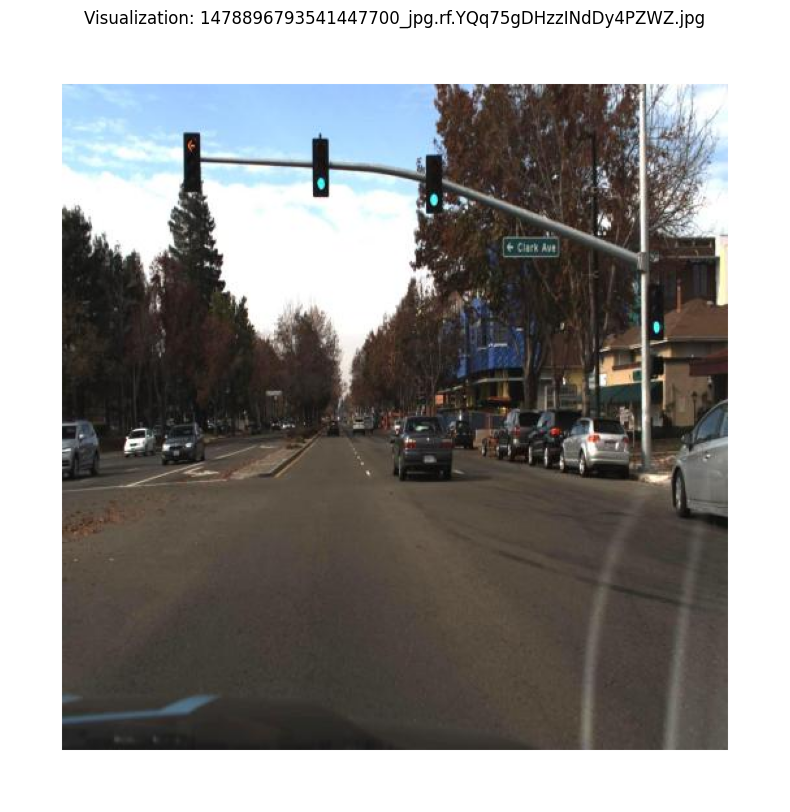

Flip:
No bounding boxes found
Color:
No bounding boxes found
Affine:
No bounding boxes found


In [9]:
image_paths = list(images_dir.glob("*"))

for i in range(3):
    img_path = random.choice(image_paths)
    label_path = labels_dir / (img_path.stem + ".txt")

    print("Original:")
    visualize_image(img_path, label_path, class_names, colors)

    print("Flip:")
    visualize_augmented_image(img_path, label_path, aug_flip)

    print("Color:")
    visualize_augmented_image(img_path, label_path, aug_color)

    print("Affine:")
    visualize_augmented_image(img_path, label_path, aug_affine)

## Training Experiments

We evaluate how augmentations affect model performance:

In [10]:
kwargs = {"fliplr": 0.5}
run_pipeline(
    str(yaml_path),
    name="flip",
    **kwargs,
)

New https://pypi.org/project/ultralytics/8.4.32 available 😃 Update with 'pip install -U ultralytics'
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/maria/Projects/IAD_MAG_ML/LAB3/data/dm-2026-lab-3-object-detection/YOLO/yolo_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=3, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=data/model/yolo12n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=flip7, nbs=64, nms=Fa

In [11]:
run_pipeline(
    str(yaml_path),
    name="color",
    hsv_h=0.015,
    hsv_s=0.7,
    hsv_v=0.5
)

New https://pypi.org/project/ultralytics/8.4.32 available 😃 Update with 'pip install -U ultralytics'
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/maria/Projects/IAD_MAG_ML/LAB3/data/dm-2026-lab-3-object-detection/YOLO/yolo_dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=3, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.5, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=data/model/yolo12n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=color, nbs=64, nms=False

In [12]:
run_pipeline(
    str(yaml_path),
    name="affine",
    degrees=10,
    translate=0.1,
    scale=0.2,
)

New https://pypi.org/project/ultralytics/8.4.32 available 😃 Update with 'pip install -U ultralytics'
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/maria/Projects/IAD_MAG_ML/LAB3/data/dm-2026-lab-3-object-detection/YOLO/yolo_dataset.yaml, degrees=10, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=3, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=data/model/yolo12n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=affine, nbs=64, nms=False

In [13]:
run_pipeline(
    str(yaml_path),
    name="mosaic",
    mosaic=1.0
)

New https://pypi.org/project/ultralytics/8.4.32 available 😃 Update with 'pip install -U ultralytics'
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/maria/Projects/IAD_MAG_ML/LAB3/data/dm-2026-lab-3-object-detection/YOLO/yolo_dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=3, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=data/model/yolo12n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=mosaic, nbs=64, nms=Fals